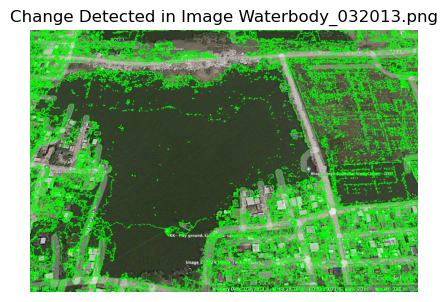

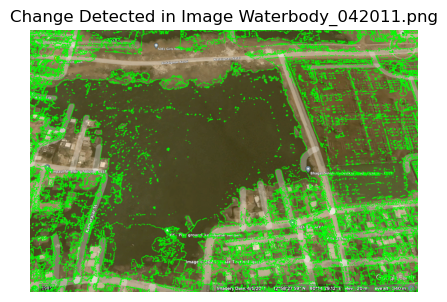

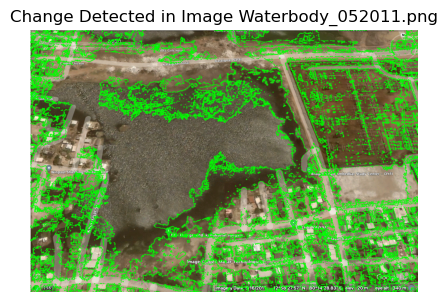

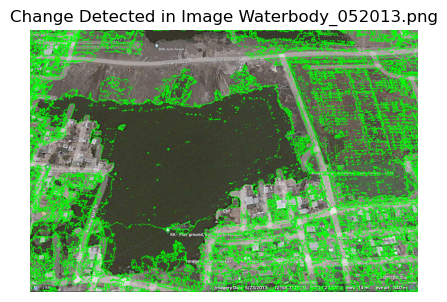

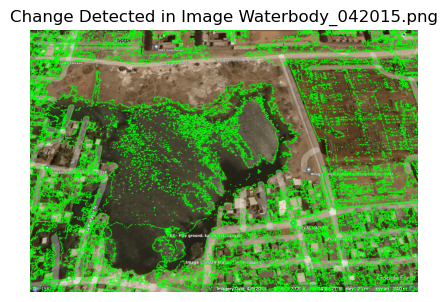

...

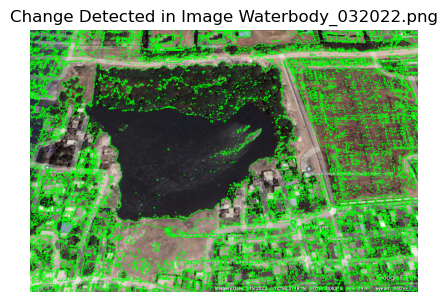

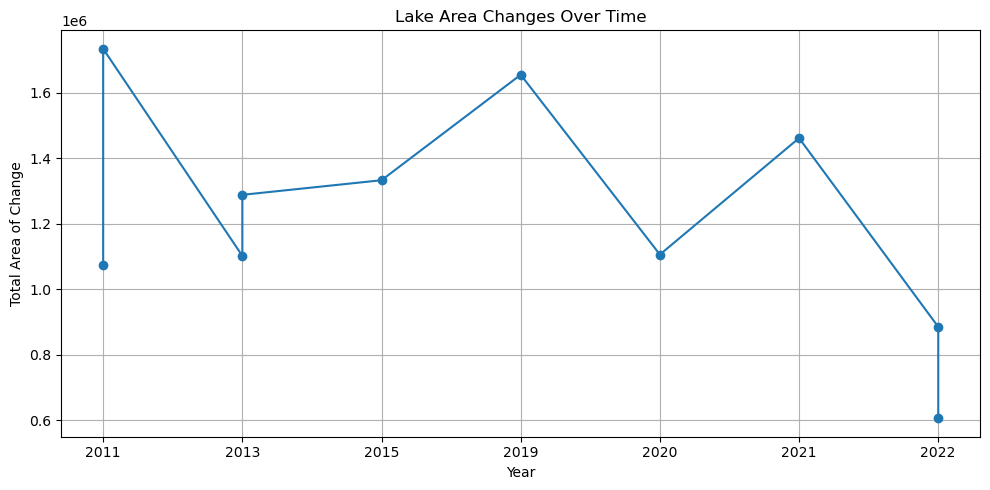

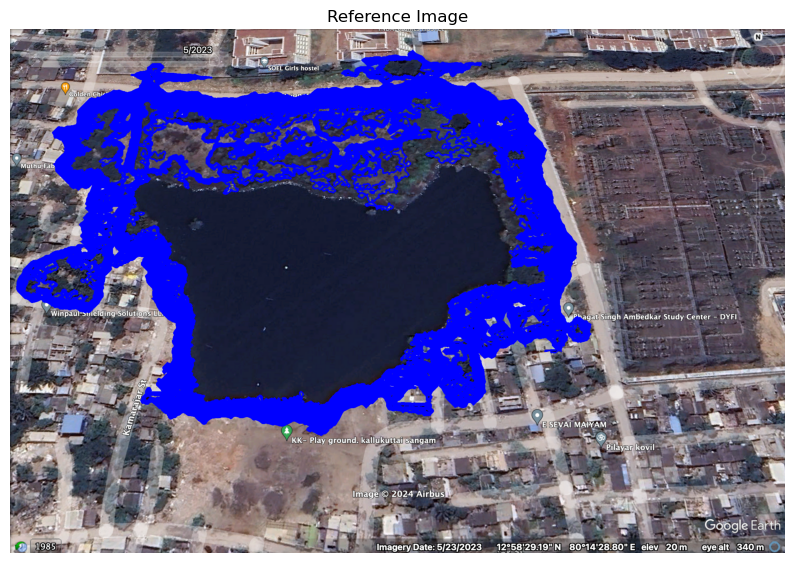

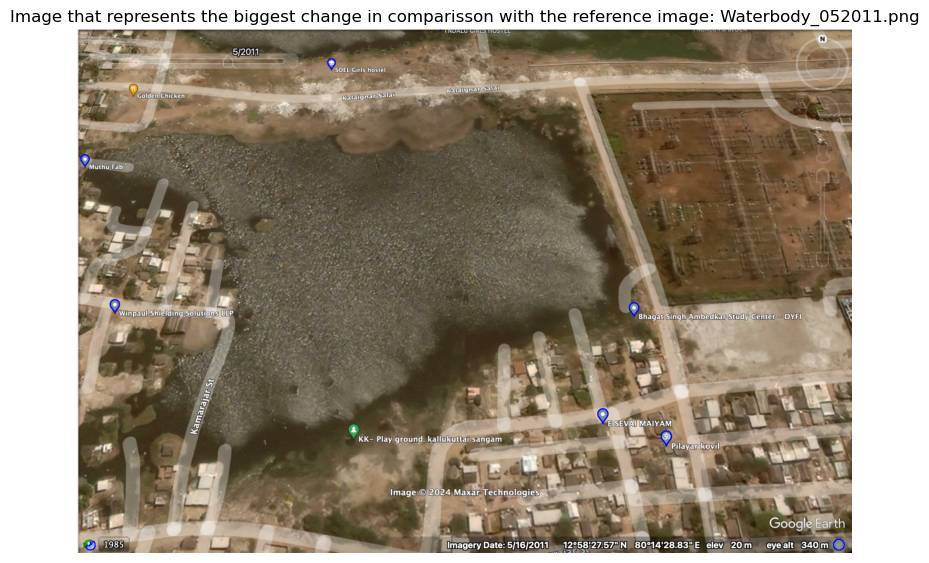

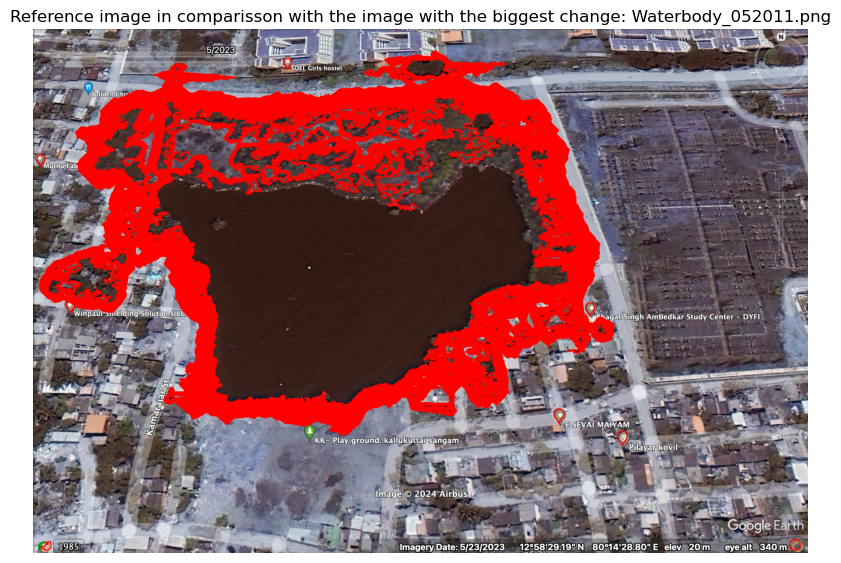


Summary of Detected Changes:
Image Waterbody_032013.png: 8636 regions changed with a total area of 1101408.00 pixels
Image Waterbody_042011.png: 6293 regions changed with a total area of 1074761.50 pixels
Image Waterbody_052011.png: 6389 regions changed with a total area of 1733689.00 pixels
Image Waterbody_052013.png: 7283 regions changed with a total area of 1287777.00 pixels
Image Waterbody_042015.png: 7909 regions changed with a total area of 1332347.50 pixels
Image Waterbody_032019.png: 4824 regions changed with a total area of 1654496.50 pixels
Image Waterbody_092020.png: 7559 regions changed with a total area of 1105367.00 pixels
Image Waterbody_052021.png: 5850 regions changed with a total area of 1460988.00 pixels
Image Waterbody_032022.png: 8214 regions changed with a total area of 884658.50 pixels
Image Waterbody_062022.png: 7789 regions changed with a total area of 605533.00 pixels
Image Waterbody_032022.png: 8214 regions changed with a total area of 884658.50 pixels


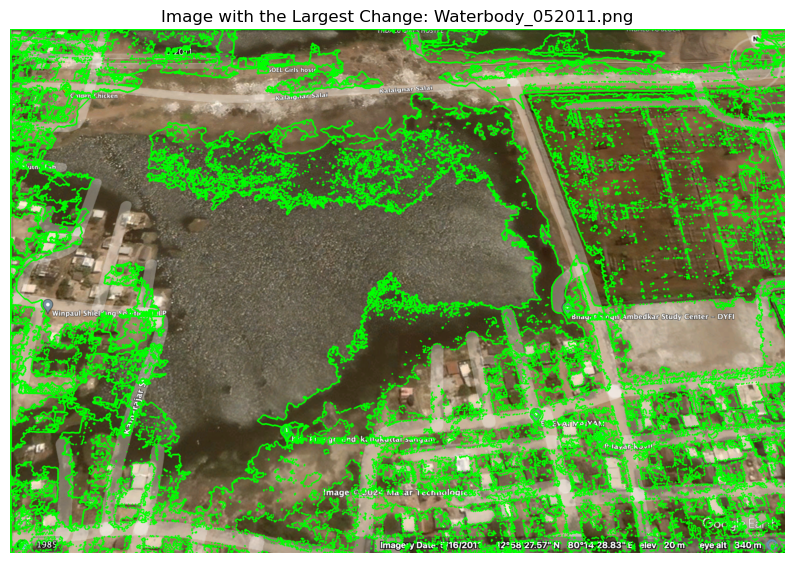

Total changed area across all images: 13125684.50 pixels
Total regions of change detected: 78960


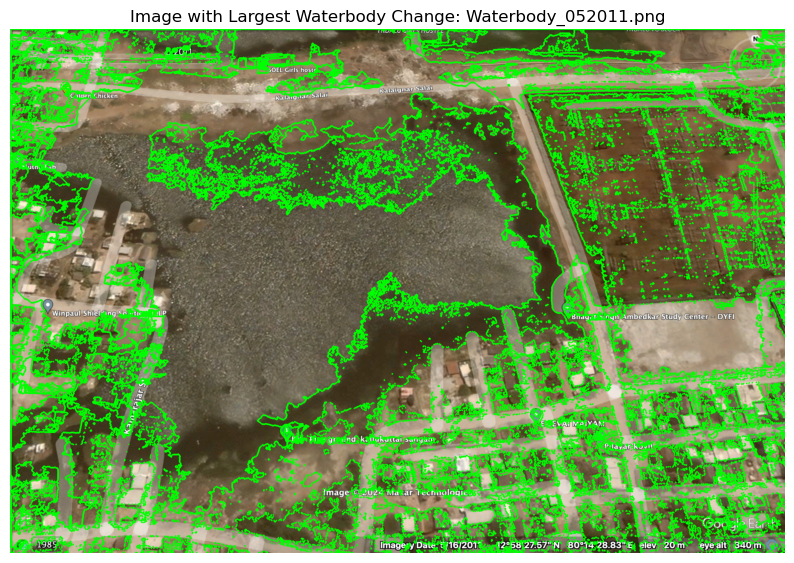

Image with the biggest encroachment: Waterbody_052011.png


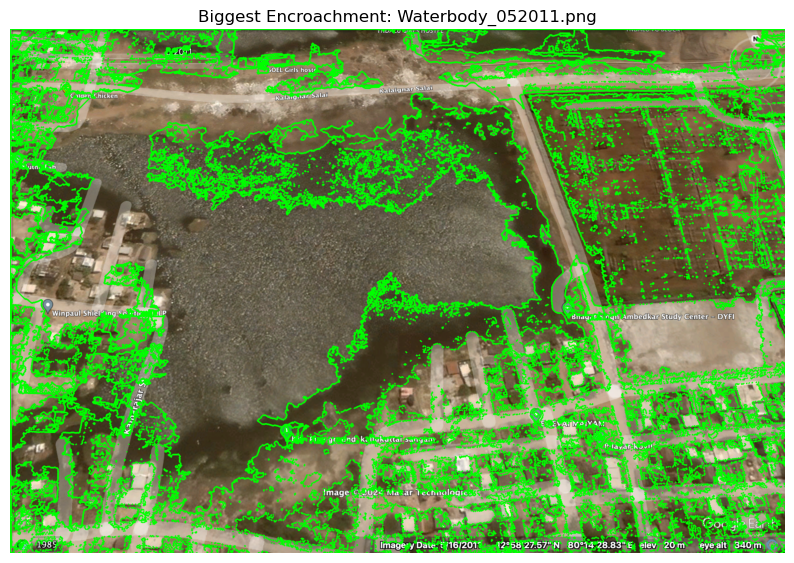

In [1]:
#interesting article https://en.wikipedia.org/wiki/Kernel_(image_processing)
import cv2
#cv2 reads in channel as BGR
import numpy as np
import os
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
#matplotlib reads in channels as RGB
import re



def load_images(image_files, base_directory):
    images = []
    reference_size = None
    for file in image_files:
        path = os.path.join(base_directory, file)
        image = cv2.imread(path, cv2.IMREAD_COLOR)
        if image is not None:
            if reference_size is None:
                reference_size = image.shape[1], image.shape[0]
            resized_image = cv2.resize(image, reference_size, interpolation=cv2.INTER_AREA)
            images.append(resized_image)
        else:
            print(f"Failed to load image: {file}")
    return images, reference_size

def preprocess_images(images):
    processed_images = []
    for image in images:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        processed_images.append(gray_image)
    return processed_images

def compute_differences(images):
    reference_image = images[0]
    differences = []
    for image in images[1:]:
        difference = cv2.absdiff(reference_image, image)
        differences.append(difference)
    return differences

def analyze_changes(differences):
    change_analysis = []
    change_stats = []
    for diff in differences:
        ret, thresh = cv2.threshold(diff, 50, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        total_area = sum(cv2.contourArea(contour) for contour in contours)
        change_analysis.append(contours)
        change_stats.append({'count': len(contours), 'area': total_area})
    return change_analysis, change_stats

# Define your image files and base directory
image_files = [
        "Waterbody_052023.png",
    "Waterbody_032013.png",
    "Waterbody_042011.png",
    "Waterbody_052011.png",
    "Waterbody_052013.png",
    "Waterbody_042015.png",
    "Waterbody_032019.png",
    "Waterbody_092020.png",
    "Waterbody_052021.png",
    "Waterbody_032022.png",
    "Waterbody_062022.png",
    "Waterbody_032022.png",
]
base_directory = "/Users/breisdas/Mastermind/Velachery_waterbody/Images/"
reference_image_path = os.path.join(base_directory, image_files[0])
reference_image = cv2.imread(reference_image_path)

def extract_date(filepath):
    filename = os.path.basename(filepath)
    match = re.search(r'Waterbody_(\d{2})(\d{4})\.png', filename)
    if match:
        date_str = match.group(1) + match.group(2)
        return datetime.strptime(date_str, '%m%Y')
    else:
        raise ValueError(f"Filename {filename} does not contain a valid date in MMYYYY format.")
        
def find_waterbody_contours(image):
    # Convert image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # Define range for blue colors typically representing water
    lower_blue = np.array([90, 50, 50])
    upper_blue = np.array([150, 255, 255])
    # Create a binary mask where blue colors are white and the rest are black
    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    # Find contours in the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

def draw_waterbody_contours(image, contours):
    # Draw contours on the image
    cv2.drawContours(image, contours, -1, (255, 0, 0), 2)
    return image


# Load and preprocess the images
images, reference_size = load_images(image_files, base_directory)
if not images:
    print("No images could be loaded, exiting the analysis.")
else:
    processed_images = preprocess_images(images)
    differences = compute_differences(processed_images)
    changes, stats = analyze_changes(differences)

    # Find the image with the biggest change
    max_change_idx = max(range(len(stats)), key=lambda i: stats[i]['area'])
    biggest_change_image = image_files[max_change_idx + 1]

    # Display all images with changes
    for idx, change in enumerate(changes):
        plt.figure(figsize=(5,5))
        if change:
            for contour in change:
                # Green contours represent the detected changes
                cv2.drawContours(images[idx+1], contour, -1, (0,255,0), 3)
            plt.imshow(cv2.cvtColor(images[idx+1], cv2.COLOR_BGR2RGB))
            plt.title(f'Change Detected in Image {image_files[idx+1]}')
        else:
            plt.imshow(cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB))
            plt.title('No Change Detected')
        plt.axis('off')
        plt.show()

    # Plot the graph of changes over the years
    dates = [extract_date(file) for file in image_files[1:]]
    changes_by_date = {date: stat['area'] for date, stat in zip(dates, stats)}
    sorted_dates = sorted(changes_by_date)
    sorted_changes = [changes_by_date[date] for date in sorted_dates]

    plt.figure(figsize=(10, 5))
    plt.plot([date.strftime('%Y') for date in sorted_dates], sorted_changes, marker='o')
    plt.xlabel('Year')
    plt.ylabel('Total Area of Change')
    plt.title('Lake Area Changes Over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    ##Display the reference image
    
if reference_image is not None:
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display
    plt.title('Reference Image')
    plt.axis('off')  # Hide the axis
    plt.show()
else:
    print("Reference image is not available.")    

    
# Now, when you want to display the reference image with the biggest change
reference_image_with_biggest_change_path = os.path.join(base_directory, biggest_change_image)
reference_image_with_biggest_change = cv2.imread(reference_image_with_biggest_change_path)
if reference_image_with_biggest_change is None:
    print(f"Failed to load the image with the biggest change from file: {reference_image_with_biggest_change_path}")
else:
    reference_image_with_biggest_change_resized = cv2.resize(reference_image_with_biggest_change, (reference_image.shape[1], reference_image.shape[0]), interpolation=cv2.INTER_AREA)
    contours = find_waterbody_contours(reference_image_with_biggest_change_resized)
    reference_image_with_contours = draw_waterbody_contours(reference_image_with_biggest_change_resized.copy(), contours)  # Make a copy to draw on
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(reference_image_with_contours, cv2.COLOR_BGR2RGB))
    plt.title(f'Image that represents the biggest change in comparisson with the reference image: {biggest_change_image}')
    plt.axis('off')
    plt.show()
    

# Display the reference image with the biggest change
    reference_image_with_biggest_change = cv2.imread(os.path.join(base_directory, biggest_change_image))
    reference_image_with_biggest_change = cv2.resize(reference_image_with_biggest_change, reference_size, interpolation=cv2.INTER_AREA)
    reference_contours = find_waterbody_contours(reference_image_with_biggest_change)
    reference_image_with_contours = draw_waterbody_contours(reference_image, reference_contours)
    plt.figure(figsize=(10,10))
    plt.imshow(reference_image_with_contours)
    plt.title(f'Reference image in comparisson with the image with the biggest change: {biggest_change_image}')
    plt.axis('off')
    plt.show()
    
    
    # Print summary of changes
    print("\nSummary of Detected Changes:")
    for file, stat in zip(image_files[1:], stats):
        print(f"Image {file}: {stat['count']} regions changed with a total area of {stat['area']:.2f} pixels")
        
# Assuming images is a list of images loaded earlier and reference_image is the first one in this list
reference_image = images[0]  # This line ensures reference_image is defined

#Step 1: Function to Find and Display the Largest Change
def display_largest_change_image(images, changes):
    largest_area = 0
    largest_contour = None  # Directly store the largest contour
    largest_image_index = None

    for idx, contours in enumerate(changes):
        for contour in contours:
            area = cv2.contourArea(contour)
            if area > largest_area:
                largest_area = area
                largest_contour = contour  # Update largest contour
                largest_image_index = idx + 1  # +1 because 'changes' excludes the reference image

    if largest_image_index is not None and largest_contour is not None:
        # Draw the largest contour on the image
        cv2.drawContours(images[largest_image_index], [largest_contour], -1, (0, 255, 0), 3)
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(images[largest_image_index], cv2.COLOR_BGR2RGB))
        plt.title(f"Image with the Largest Change: {image_files[largest_image_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No significant changes detected.")

display_largest_change_image(images, changes)


#Step 2: Rudimentary Summary of Changes
def print_summary_of_changes(stats):
    total_changed_area = sum(stat['area'] for stat in stats)
    total_regions_changed = sum(stat['count'] for stat in stats)
    print(f"Total changed area across all images: {total_changed_area:.2f} pixels")
    print(f"Total regions of change detected: {total_regions_changed}")

print_summary_of_changes(stats)

def display_largest_waterbody_change(images, changes):
    largest_change_area = 0
    largest_change_image_index = None
    largest_change_contour = None

    # Iterate through each image's changes to find the largest change in waterbody
    for idx, contour_list in enumerate(changes):
        for contour in contour_list:
            area = cv2.contourArea(contour)
            if area > largest_change_area:
                largest_change_area = area
                largest_change_image_index = idx + 1  # Adding 1 to account for reference image
                largest_change_contour = contour

    # Display the image with the largest change in waterbody area
    if largest_change_image_index is not None:
        img_with_largest_change = images[largest_change_image_index].copy()
        cv2.drawContours(img_with_largest_change, [largest_change_contour], -1, (0, 255, 0), 3)
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img_with_largest_change, cv2.COLOR_BGR2RGB))
        plt.title(f"Image with Largest Waterbody Change: {image_files[largest_change_image_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No significant waterbody changes detected.")

# Call the function after analyzing the changes
display_largest_waterbody_change(images, changes)

def analyze_encroachment(images, changes):
    waterbody_areas = []
    for contours in changes:
        # Assuming the largest contour in each image is the waterbody
        largest_contour = max(contours, key=cv2.contourArea) if contours else None
        area = cv2.contourArea(largest_contour) if largest_contour is not None else 0
        waterbody_areas.append(area)

    # Assuming the first image is the reference, calculate the change in area
    # Negative values indicate a reduction in waterbody area (potential encroachment)
    area_changes = [waterbody_areas[0] - area for area in waterbody_areas]
    
    # Find the image with the largest reduction in waterbody area
    min_change = min(area_changes)
    if min_change < 0:  # Ensuring that there's a reduction
        encroachment_image_index = area_changes.index(min_change) + 1  # +1 to adjust index
        print(f"Image with the biggest encroachment: {image_files[encroachment_image_index]}")
        
        # Display the image with the biggest encroachment
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(images[encroachment_image_index], cv2.COLOR_BGR2RGB))
        plt.title(f"Biggest Encroachment: {image_files[encroachment_image_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No significant encroachment detected.")

# Call this function after analyzing the changes
analyze_encroachment(images, changes)



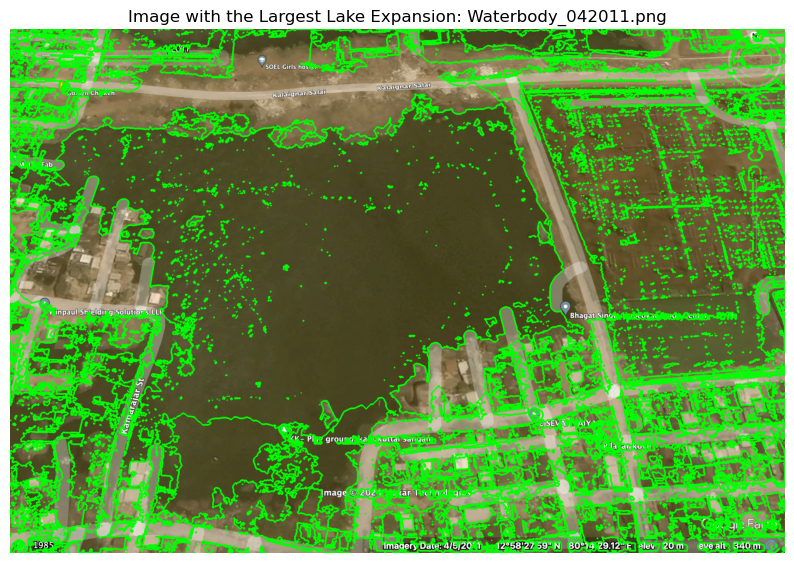

In [2]:
def display_largest_expansion_image(images, changes, stats):
    # Initialize variables to track the largest expansion
    largest_expansion_area = 0
    image_with_largest_expansion_index = None

    # Calculate the area of the waterbody in the reference image for comparison
    reference_area = sum(cv2.contourArea(contour) for contour in changes[0])

    # Loop through the stats to find the largest expansion
    for idx, stat in enumerate(stats[1:], start=1): # Skip the reference image
        current_area = stat['area']
        expansion = current_area - reference_area
        if expansion > largest_expansion_area:
            largest_expansion_area = expansion
            image_with_largest_expansion_index = idx

    if image_with_largest_expansion_index is not None:
        # Draw all contours on the image with the largest expansion
        for contour in changes[image_with_largest_expansion_index-1]: # -1 because 'changes' includes the reference image at index 0
            cv2.drawContours(images[image_with_largest_expansion_index], [contour], -1, (0, 255, 0), 3)
        
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(images[image_with_largest_expansion_index], cv2.COLOR_BGR2RGB))
        plt.title(f"Image with the Largest Lake Expansion: {image_files[image_with_largest_expansion_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No expansion detected or data insufficient for comparison.")

# Call the function to display the image with the largest lake expansion
display_largest_expansion_image(images, changes, stats)


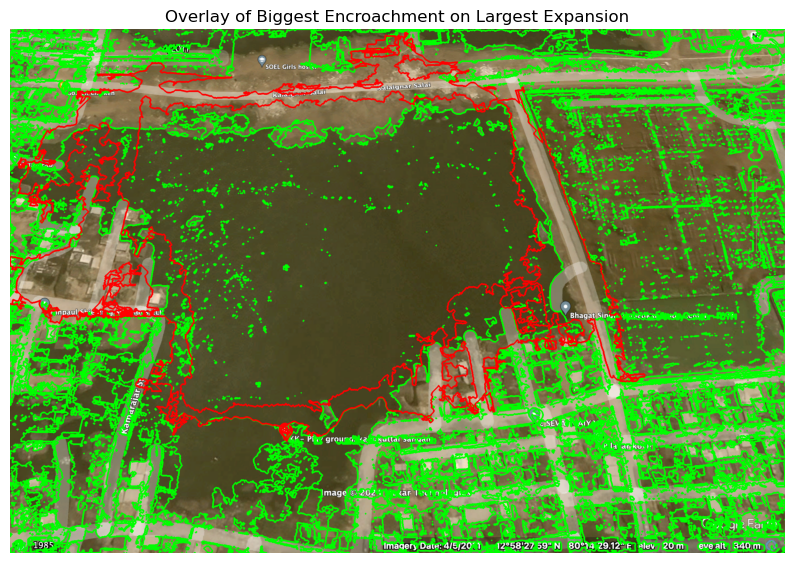

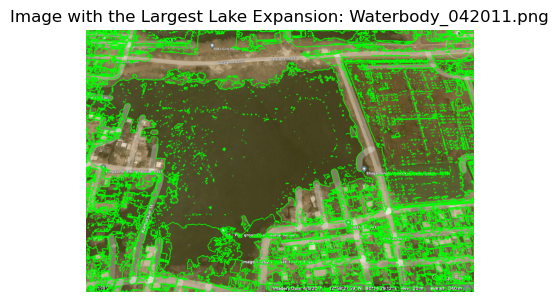

Image with the biggest encroachment: Waterbody_052011.png


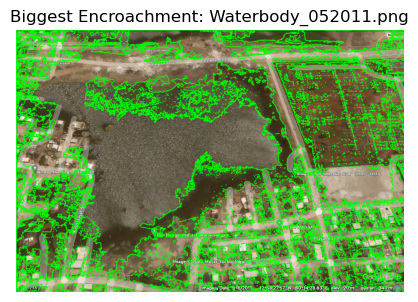

In [3]:
def find_largest_expansion(changes, stats):
    # Assuming 'stats' contains the area of waterbody for each image
    # Expansion is identified by an increase in waterbody area compared to the reference
    max_expansion_area = 0
    expansion_index = None
    expansion_contour = None

    for i, stat in enumerate(stats[1:], 1):  # Skip reference image at index 0
        if stat['area'] > max_expansion_area:
            max_expansion_area = stat['area']
            expansion_index = i
            expansion_contour = max(changes[i-1], key=cv2.contourArea)  # -1 because 'changes' includes reference at index 0

    return expansion_index, expansion_contour

def find_largest_encroachment(changes, stats):
    # Assuming 'stats' contains the area of waterbody for each image
    # Encroachment is identified by a decrease in waterbody area compared to the reference
    min_encroachment_area = float('inf')
    encroachment_index = None
    encroachment_contour = None

    for i, stat in enumerate(stats[1:], 1):  # Skip reference image at index 0
        if stat['area'] < min_encroachment_area:
            min_encroachment_area = stat['area']
            encroachment_index = i
            encroachment_contour = max(changes[i-1], key=cv2.contourArea)  # -1 because 'changes' includes reference at index 0

    return encroachment_index, encroachment_contour

def overlay_encroachment_on_expansion(images, changes, stats):
    expansion_index, expansion_contour = find_largest_expansion(changes, stats)
    encroachment_index, encroachment_contour = find_largest_encroachment(changes, stats)

    if expansion_index is not None and encroachment_index is not None:
        image_with_overlay = images[expansion_index].copy()
        cv2.drawContours(image_with_overlay, [expansion_contour], -1, (0, 255, 0), 3)  # Draw expansion in green
        cv2.drawContours(image_with_overlay, [encroachment_contour], -1, (0, 0, 255), 3)  # Draw encroachment in red

        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(image_with_overlay, cv2.COLOR_BGR2RGB))
        plt.title("Overlay of Biggest Encroachment on Largest Expansion")
        plt.axis('off')
        plt.show()
    else:
        print("Could not find the largest expansion or biggest encroachment.")

# Assuming you have already defined 'images', 'changes', and 'stats'
# Call the function with actual parameters
overlay_encroachment_on_expansion(images, changes, stats)


def display_largest_expansion_image(images, changes, stats):
    # Initialize variables to track the largest expansion
    largest_expansion_area = 0
    image_with_largest_expansion_index = None

    # Calculate the area of the waterbody in the reference image for comparison
    reference_area = sum(cv2.contourArea(contour) for contour in changes[0])

    # Loop through the stats to find the largest expansion
    for idx, stat in enumerate(stats[1:], start=1): # Skip the reference image
        current_area = stat['area']
        expansion = current_area - reference_area
        if expansion > largest_expansion_area:
            largest_expansion_area = expansion
            image_with_largest_expansion_index = idx

    if image_with_largest_expansion_index is not None:
        # Draw all contours on the image with the largest expansion
        for contour in changes[image_with_largest_expansion_index-1]: # -1 because 'changes' includes the reference image at index 0
            cv2.drawContours(images[image_with_largest_expansion_index], [contour], -1, (0, 255, 0), 3)
        
        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(images[image_with_largest_expansion_index], cv2.COLOR_BGR2RGB))
        plt.title(f"Image with the Largest Lake Expansion: {image_files[image_with_largest_expansion_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No expansion detected or data insufficient for comparison.")

# Call the function to display the image with the largest lake expansion
display_largest_expansion_image(images, changes, stats)


def analyze_encroachment(images, changes):
    waterbody_areas = []
    for contours in changes:
        # Assuming the largest contour in each image is the waterbody
        largest_contour = max(contours, key=cv2.contourArea) if contours else None
        area = cv2.contourArea(largest_contour) if largest_contour is not None else 0
        waterbody_areas.append(area)

    # Assuming the first image is the reference, calculate the change in area
    # Negative values indicate a reduction in waterbody area (potential encroachment)
    area_changes = [waterbody_areas[0] - area for area in waterbody_areas]
    
    # Find the image with the largest reduction in waterbody area
    min_change = min(area_changes)
    if min_change < 0:  # Ensuring that there's a reduction
        encroachment_image_index = area_changes.index(min_change) + 1  # +1 to adjust index
        print(f"Image with the biggest encroachment: {image_files[encroachment_image_index]}")
        
        # Display the image with the biggest encroachment
        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(images[encroachment_image_index], cv2.COLOR_BGR2RGB))
        plt.title(f"Biggest Encroachment: {image_files[encroachment_image_index]}")
        plt.axis('off')
        plt.show()
    else:
        print("No significant encroachment detected.")

# Call this function after analyzing the changes
analyze_encroachment(images, changes)

